<br>

# Problem Statement
### The problem of analyzing the interactions between various characters of the French historical novel Les Misérables by Victor Hugo and by doing so able to understand the importance of each character in relation to the plot. The problem will be interested for those, who likes this novel and its numerous adaptations for film, television and the stage. 
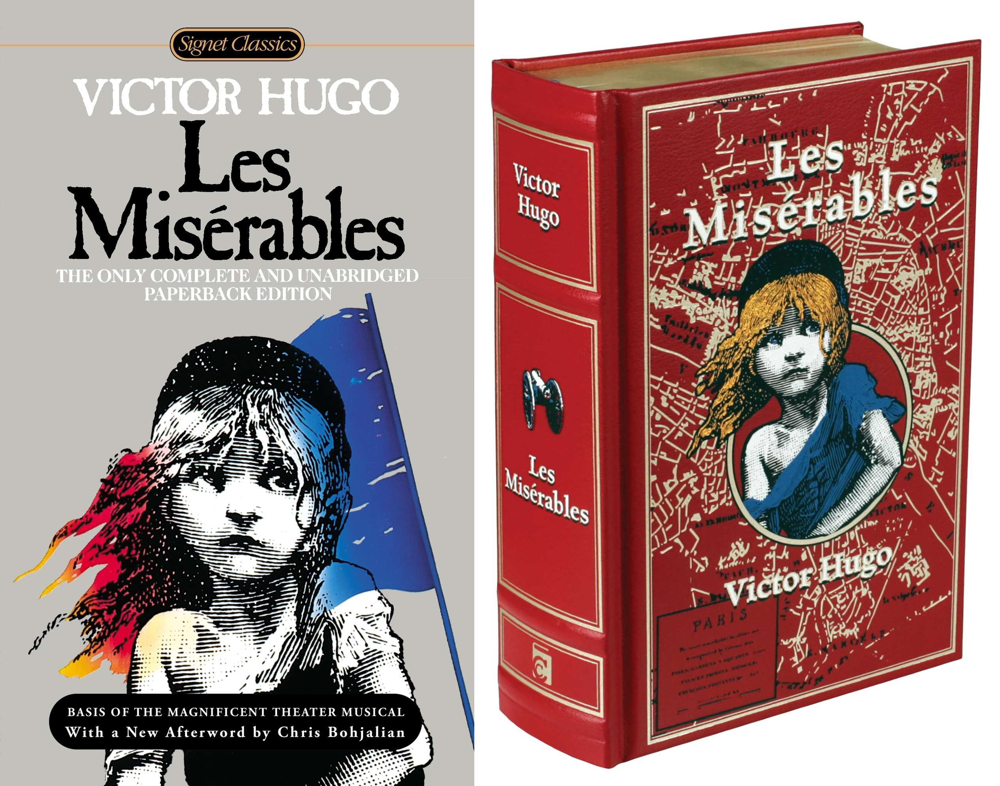


In [1]:
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms.community import _naive_greedy_modularity_communities

In [18]:
D=df = pd.read_csv("C:\\Users\\hp pc\\Desktop\\TSMA ETE\\lesmis.csv")
D.head()

,Appearance,Coappearance
0,Myriel,Napoleon
1,Myriel,MlleBaptistine
2,Myriel,MmeMagloire
3,Myriel,CountessDeLo
4,Myriel,Geborand


In [2]:
G = nx.read_gml('C:\\Users\\hp pc\\Desktop\\TSMA ETE\\lesmis.gml')

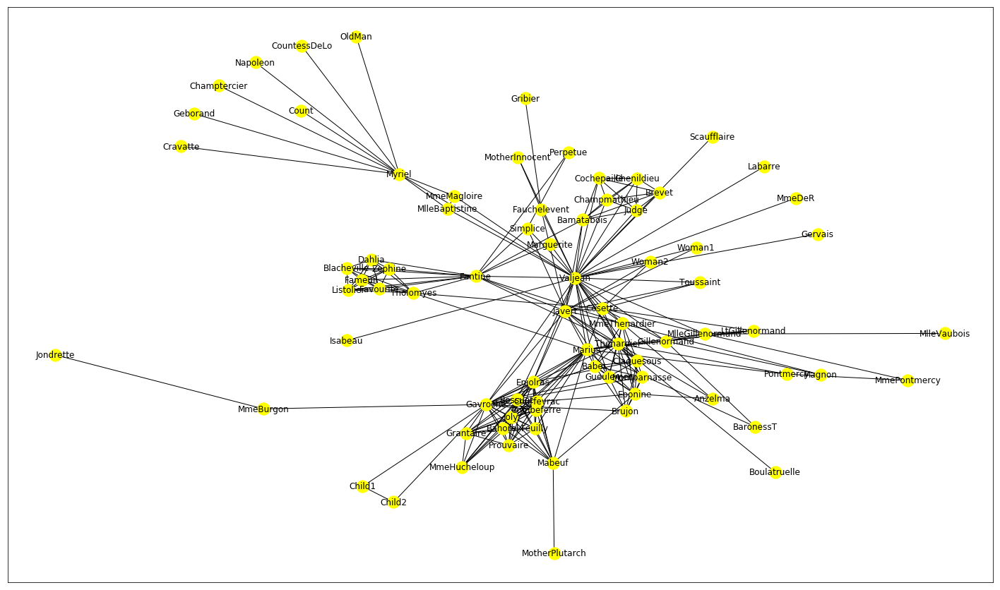

In [3]:
G = nx.les_miserables_graph()
plt.figure(1, figsize=(25,15))

nx.draw_networkx(G, pos=nx.spring_layout(G, seed=675), with_labels=True, node_color='yellow')

# Descriptive Statisitcs

In [4]:
print(f'Number of nodes:{len(G.nodes())}')
print(f'Number of edges:{len(G.edges())}')
print(f'Network density:{nx.density(G)}')

Number of nodes:77
Number of edges:254
Network density:0.08680792891319207


## We can say there are 77 prominent characters in the Novel

In [5]:
#nx.degree_centrality(G)
#nx.closeness_centrality(g)
#nx.betweenness_centrality(g)
#nx.eigenvector_centrality(g)

import pandas as pd
df = pd.DataFrame()
df['degree'] = pd.Series(nx.degree_centrality(G))
df['closeness'] = pd.Series(nx.closeness_centrality(G))
df['betweenness'] = pd.Series(nx.betweenness_centrality(G))
df['eigenvector'] = pd.Series(nx.eigenvector_centrality(G))

# Network Analysis

### Centrality Measures - It is a classical concept in graph analysis. It measures the "importance" of nodes. The notions of "importance" are different.
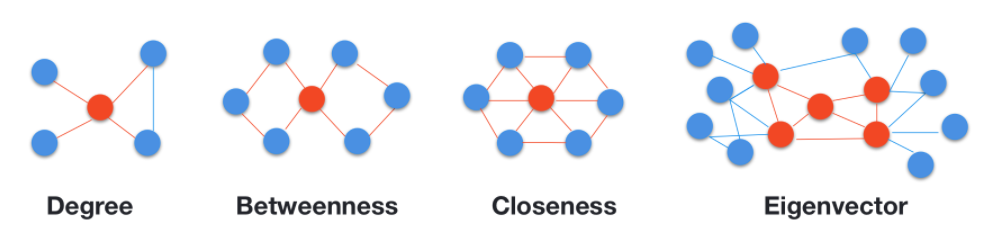

## 1. Degree Centrality - How many nodes can one node reach directly?

 ### 1.1 Degree centrality Table

In [6]:
df_top_nodes = df.sort_values('degree', ascending=False)[:5]
df_top_nodes

,degree,closeness,betweenness,eigenvector
Valjean,0.473684,0.644068,0.569989,0.267618
Gavroche,0.289474,0.513514,0.165113,0.317839
Marius,0.250000,0.531469,0.132032,0.259111
Javert,0.223684,0.517007,0.054332,0.184225
Thenardier,0.210526,0.517007,0.074901,0.187808


 ### 1.2 Degree centrality Graph

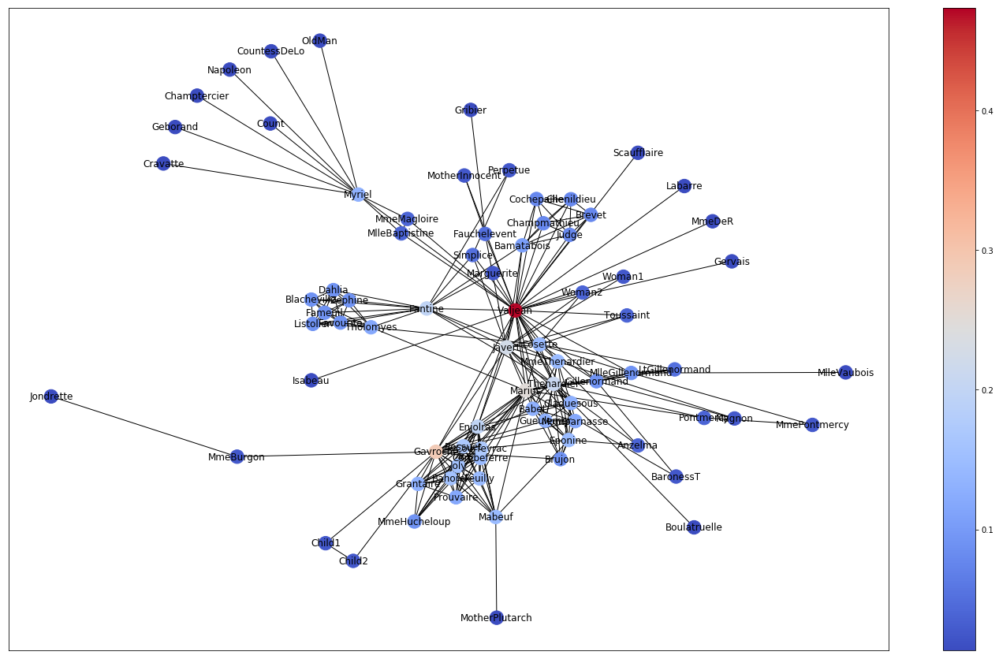

In [7]:
vmin = min(list(nx.degree_centrality(G).values()))
vmax = max(list(nx.degree_centrality(G).values()))
cmap = plt.cm.coolwarm

plt.figure(1, figsize=(25,15))
nx.draw_networkx(G, pos=nx.spring_layout(G, seed=675), with_labels=True, node_color=list(nx.degree_centrality(G).values()), cmap=cmap, vmin=vmin, vmax=vmax)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm.set_array([])
cbar = plt.colorbar(sm)

### The node with the highest degree centrality is Valjean, who is the protagonist of the novel, which explains his high degree centrality indicating his central role in the book as the main character and his role as broker between different characters. He has more direct connections with other characters than the others
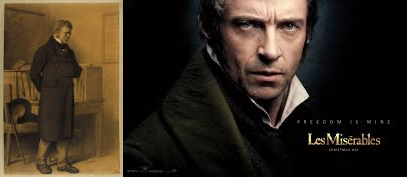

<br>

## 2. Eigenvector centrality - How well is the node connected to other well- connected nodes?

 ### 2.1 Eigenvector centrality Table

In [8]:
df_top_nodes = df.sort_values('eigenvector', ascending=False)[:5]
df_top_nodes

,degree,closeness,betweenness,eigenvector
Gavroche,0.289474,0.513514,0.165113,0.317839
Valjean,0.473684,0.644068,0.569989,0.267618
Enjolras,0.197368,0.481013,0.042553,0.267179
Marius,0.250000,0.531469,0.132032,0.259111
Bossuet,0.171053,0.475000,0.030754,0.242131


### 2.2 Eigenvector centrality Table

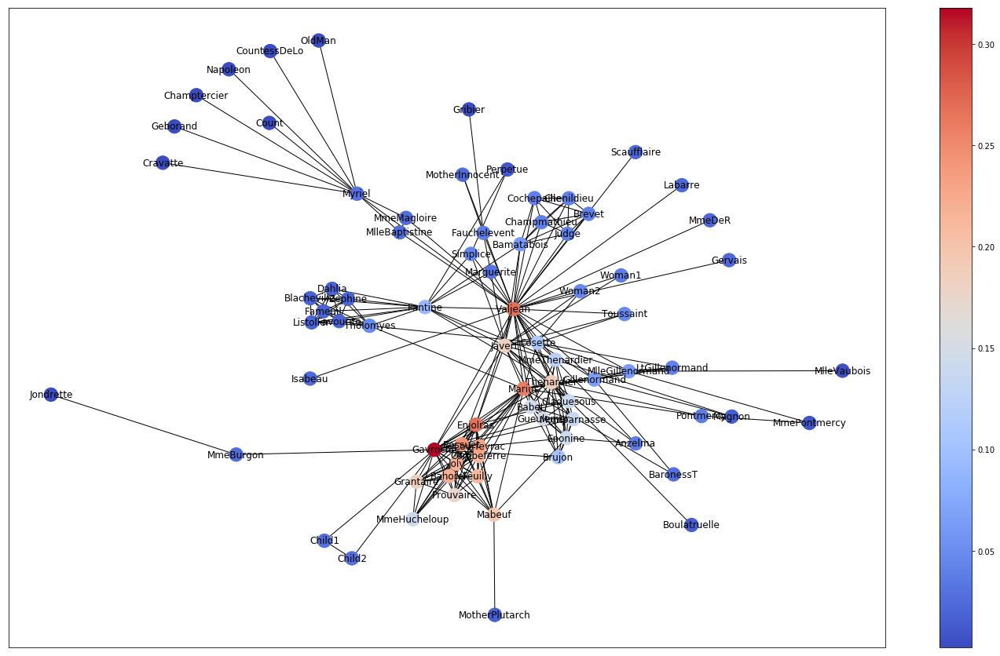

In [9]:
vmin = min(list(nx.eigenvector_centrality(G).values()))
vmax = max(list(nx.eigenvector_centrality(G).values()))
cmap = plt.cm.coolwarm

plt.figure(1, figsize=(25,15))
nx.draw_networkx(G, pos=nx.spring_layout(G, seed=675), with_labels=True, node_color=list(nx.eigenvector_centrality(G).values()), cmap=cmap, vmin=vmin, vmax=vmax)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm.set_array([])
cbar = plt.colorbar(sm)

### 1. The node with the highest Eigenvector centrality is that of Gavroche, a young street urchin who acts as an unofficial courier linking many other characters together, thereby his connection to many other nodes who themselves have a high score.
### 2. He is a boy who lives on the streets of Paris. His name has become a synonym for an urchin or street child. Gavroche plays a short yet significant role in the many adaptations of Les Misérables, sharing the populist ideology of the Friends of the ABC and joining the revolutionaries in the June 1832 rebellion. He figures in the 3rd, 4th and 5th parts of the novel.
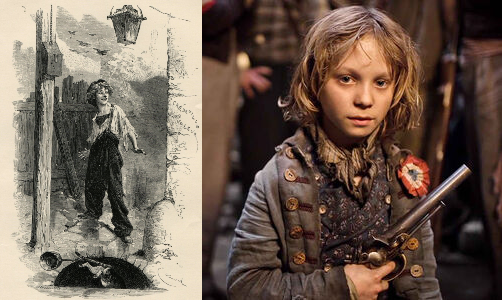

<br>

## 3. Closeness Centrality- How fast can a node reach every other nodes in the network?

### 3.1 Closeness Centrality Table

In [10]:
df_top_nodes = df.sort_values('closeness', ascending=False)[:5]
df_top_nodes

,degree,closeness,betweenness,eigenvector
Valjean,0.473684,0.644068,0.569989,0.267618
Marius,0.250000,0.531469,0.132032,0.259111
Thenardier,0.210526,0.517007,0.074901,0.187808
Javert,0.223684,0.517007,0.054332,0.184225
Gavroche,0.289474,0.513514,0.165113,0.317839


### 3.2 Closeness Centrality Graph

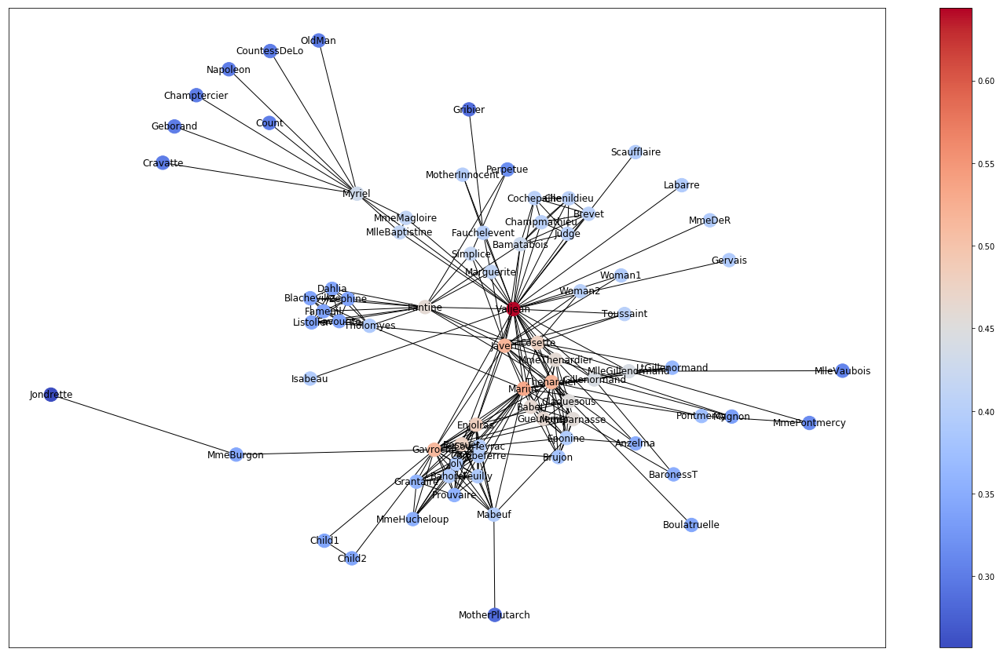

In [11]:
vmin = min(list(nx.closeness_centrality(G).values()))
vmax = max(list(nx.closeness_centrality(G).values()))
cmap = plt.cm.coolwarm

plt.figure(1, figsize=(25,15))
nx.draw_networkx(G, pos=nx.spring_layout(G, seed=675), with_labels=True, node_color=list(nx.closeness_centrality(G).values()), cmap=cmap, vmin=vmin, vmax=vmax)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm.set_array([])
cbar = plt.colorbar(sm)

### The node with the highest Closeness Centrality is that of Valjean, as him being the central character of the novel means that he is close to many other characters and can be considered as a good "broadcaster" and influencer.

<br>

## 4. Betweenness - How likely is this node to be the most direct route between two nodes in the network?

### 4.1 Betweenness Centrality Table

In [12]:
df_top_nodes = df.sort_values('betweenness', ascending=False)[:5]
df_top_nodes

,degree,closeness,betweenness,eigenvector
Valjean,0.473684,0.644068,0.569989,0.267618
Myriel,0.131579,0.429379,0.176842,0.028134
Gavroche,0.289474,0.513514,0.165113,0.317839
Marius,0.250000,0.531469,0.132032,0.259111
Fantine,0.197368,0.460606,0.129645,0.089759


### 4.2 Betweenness Centrality Graph

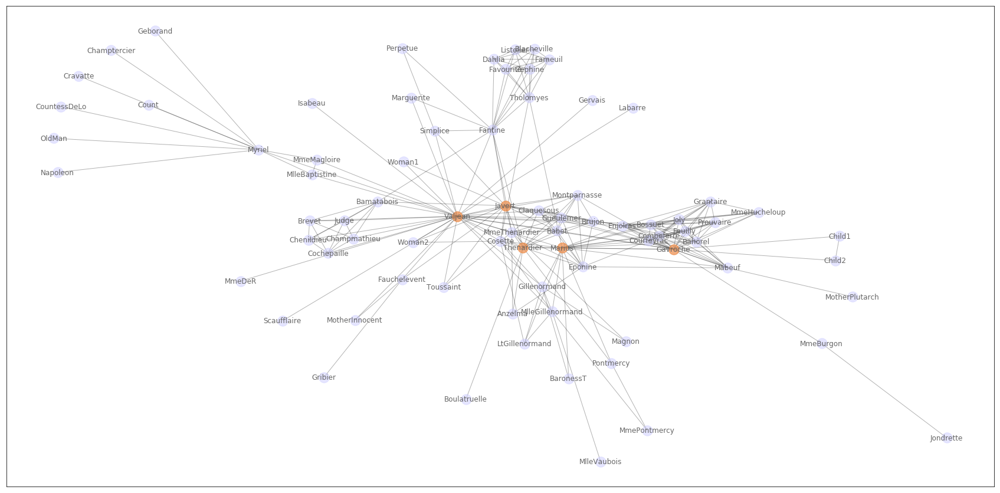

In [13]:
pos =nx.spring_layout(G)
#draw degree centrality
df_top_nodes = df.sort_values('degree', ascending=False)[:5]

plt.figure(figsize=(30, 15))
# we don't run the spring layout again; to keep the positions in this section
#pos =nx.spring_layout(g)
nx.draw_networkx_nodes(G, pos, node_color='#ccccff', alpha=0.5)
nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.3)
labels = dict([(n, n) for n in G.nodes])
_ = nx.draw_networkx_labels(G, pos, labels=labels, font_color='#666666')
nx.draw_networkx_nodes(G, pos, nodelist=list(df_top_nodes.index), node_color='#ff7700', alpha=0.5)

<br>

## 5. Communities -Community detection can help us categorize every single node into different groups based on different characteristics so that we can study them as whole. Other importance of community detection is to help us find the missing links and identify the false links in one network.

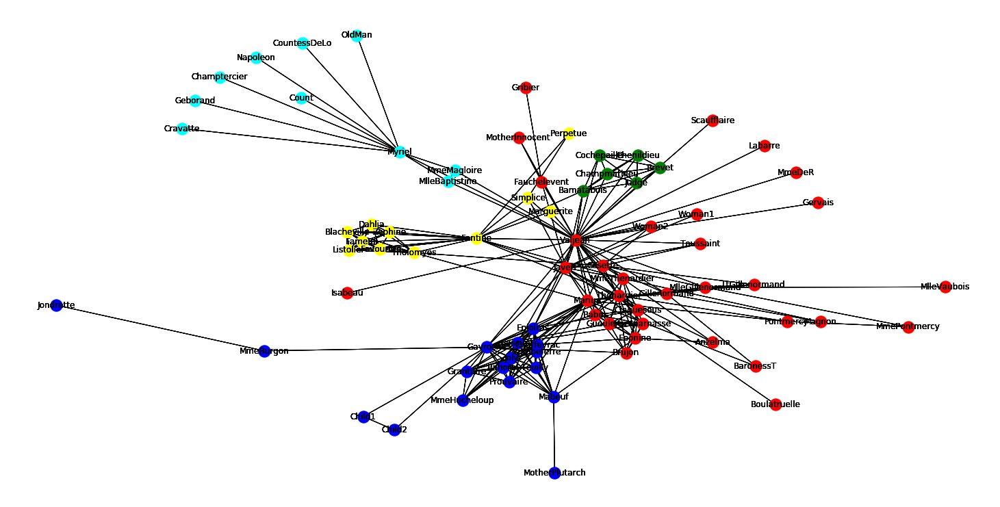

In [14]:
communities = list(_naive_greedy_modularity_communities(G))

colors = ["red", "blue", "yellow", "cyan", "green", "indigo", "pink", "grey"]

plt.figure(1, figsize=(20,10))

for i in range(len(communities)):
    graph = communities[i]
    nx.draw(G, pos=nx.spring_layout(G, seed=675), nodelist=[node for node in graph], node_color=colors[i%10], with_labels=True)


### There exists 5 distinct communities when dividing based on the naive implementation of the greedy modularity algorithm, with the biggest community in terms of number of nodes being centered around Valjean.

<br>

## 6. Some other Calculations
### a.) Diameter: Maximum distance between any pair of nodes.

### b.) Eccentricity: Eccentricity of a node 'n' is the largest distance between 'n' and all other nodes.

### c.) Radius of the graph is the minimum eccentricity

### d.) Periphery Set of nodes in a graph that has eccentricity equal to diameter.

### e.) Center of the graph Set of nodes that have eccentricityequal to radius

In [15]:
print("diameter: ", nx.diameter(G))
print("Eccentricity: ", nx.eccentricity(G))
print("Radius: ", nx.radius(G))
print("Periphery: ", nx.periphery(G))
print("Center: ", nx.center(G))

diameter:  5
Eccentricity:  {'Napoleon': 5, 'Myriel': 4, 'MlleBaptistine': 4, 'MmeMagloire': 4, 'CountessDeLo': 5, 'Geborand': 5, 'Champtercier': 5, 'Cravatte': 5, 'Count': 5, 'OldMan': 5, 'Valjean': 3, 'Labarre': 4, 'Marguerite': 4, 'MmeDeR': 4, 'Isabeau': 4, 'Gervais': 4, 'Listolier': 5, 'Tholomyes': 4, 'Fameuil': 5, 'Blacheville': 5, 'Favourite': 5, 'Dahlia': 5, 'Zephine': 5, 'Fantine': 4, 'MmeThenardier': 4, 'Thenardier': 3, 'Cosette': 4, 'Javert': 3, 'Fauchelevent': 4, 'Bamatabois': 4, 'Perpetue': 5, 'Simplice': 4, 'Scaufflaire': 4, 'Woman1': 4, 'Judge': 4, 'Champmathieu': 4, 'Brevet': 4, 'Chenildieu': 4, 'Cochepaille': 4, 'Pontmercy': 4, 'Boulatruelle': 4, 'Eponine': 4, 'Anzelma': 4, 'Woman2': 4, 'MotherInnocent': 4, 'Gribier': 5, 'MmeBurgon': 4, 'Jondrette': 5, 'Gavroche': 3, 'Gillenormand': 4, 'Magnon': 5, 'MlleGillenormand': 4, 'MmePontmercy': 5, 'MlleVaubois': 5, 'LtGillenormand': 4, 'Marius': 3, 'BaronessT': 4, 'Mabeuf': 4, 'Enjolras': 3, 'Combeferre': 4, 'Prouvaire': 4, 'Fe

## 7. Draw the shortest path between two nodes

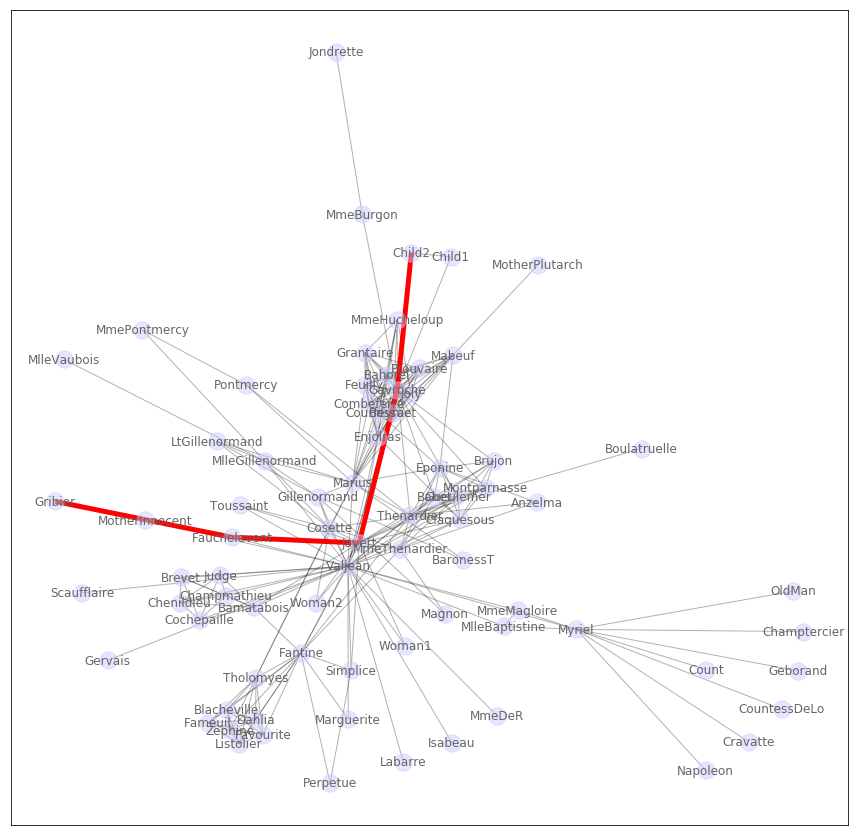

In [16]:
pos =nx.spring_layout(G)
sp = nx.shortest_path(G, 'Gribier', 'Child2')
#you can change to any other two nodes
sp

plt.figure(figsize=(15, 15))
#pos =nx.spring_layout(g)
nx.draw_networkx_nodes(G, pos, node_color='#ccccff', alpha=0.5)
nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.3)
labels = dict([(n, n) for n in G.nodes])
_ = nx.draw_networkx_labels(G, pos, labels=labels, font_color='#666666')

nx.draw_networkx_edges(G, 
                       pos,
                       edgelist=list(zip(sp[:-1], sp[1:])),
                       width=5,
                       edge_color='r'
                      )

# Conclusion
### Analyzing the network, we computed centrality measures like degree centrality, closeness centrality and eigenvector centrality that aim to find the most important nodes in a network (depending on a different notions of “important”). In our case the most important characters are Valjean and Gavroche. They are the influencers in the network. Also we checked whether there any communities or not. It turned out the network includes 5 communities. There are two comparatively large communities and three small ones, and the biggest community is centered around Valjean.
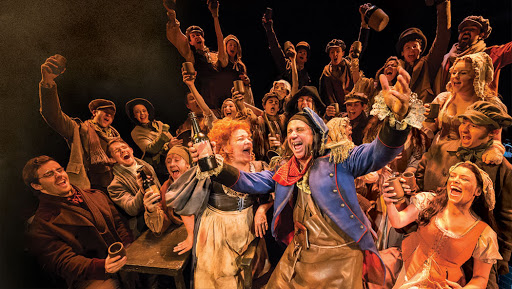